### Extract Point Cloud From Camera

In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import skimage as sk
import cv2 
import math
import ctypes
import pyglet
import pyglet.gl as gl
from natsort import natsorted
import pandas as pd
from pyntcloud import PyntCloud
from scipy.signal import find_peaks

from scipy.interpolate import make_interp_spline, BSpline
from scipy.interpolate import interp1d
from scipy.ndimage.filters import gaussian_filter1d

from skimage import io
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.animation as animation

from pclpy import pcl
import open3d as o3d
import trimesh

import pyrealsense2 as rs
import pyvista as pv

import os
from natsort import natsorted

import time

import pyrealsense2 as rs

### Helper Functions

In [2]:
def convert_depth_frame_to_pointcloud(depth_image, camera_intrinsics ):
    """
    Convert the depthmap to a 3D point cloud
    Parameters:
    -----------
    depth_frame : rs.frame() The depth_frame containing the depth map
    camera_intrinsics : The intrinsic values of the imager in whose coordinate system the depth_frame is computed
    Return:
    ----------
    x : array
        The x values of the pointcloud in meters
    y : array
        The y values of the pointcloud in meters
    z : array
        The z values of the pointcloud in meters
    """

    [height, width] = depth_image.shape

    nx = np.linspace(0, width-1, width)
    ny = np.linspace(0, height-1, height)
    u, v = np.meshgrid(nx, ny)
    x = (u.flatten() - camera_intrinsics.ppx)/camera_intrinsics.fx
    y = (v.flatten() - camera_intrinsics.ppy)/camera_intrinsics.fy

    z = depth_image.flatten() / 1000;
    x = np.multiply(x,z)
    y = np.multiply(y,z)

    x = x[np.nonzero(z)]
    y = y[np.nonzero(z)]
    z = z[np.nonzero(z)]

    return x, y, z

def SignedVolumeOfTriangle(p1, p2, p3): 
    v321 = p3[0] * p2[1] * p1[2]
    v231 = p2[0] * p3[1] * p1[2]
    v312 = p3[0] * p1[1] * p2[2]
    v132 = p1[0] * p3[1] * p2[2]
    v213 = p2[0] * p1[1] * p3[2]
    v123 = p1[0] * p2[1] * p3[2]
    
    return (1.0 / 6.0) * (-v321 + v231 + v312 - v132 - v213 + v123)

def VolumeOfMesh(mesh):
    vols = [] 
    for t in mesh.triangles: 
        x, y, z = zip(*t)
        vols.append(SignedVolumeOfTriangle(x, y, z))
    return abs(np.sum(vols))

def cluster_chest(pcd): 
    
    # cluster point clouds
    labels = np.array(pcd.cluster_dbscan(eps=0.02, min_points=10, print_progress=True))

    max_label = labels.max()
    colors = plt.get_cmap("tab20")(labels / (max_label if max_label > 0 else 1))
    colors[labels < 0] = 0

    # extract chest cluster
    unique_colors, counts = np.unique(colors[:, :3], axis=0, return_counts=True)
    max_color = unique_colors[np.argmax(counts)]
    color_reshaped = colors[:,:3].copy()
    color_reshaped[color_reshaped != max_color] = 0

    # remove other clusters from point cloud
    all_point_clouds = np.asanyarray(pcd.points)
    all_point_clouds = np.delete(all_point_clouds, np.where(color_reshaped == [0,0,0])[0], axis=0)
    
#     new_point_clouds = all_point_clouds.copy()
#     for pt in all_point_clouds[:]: 
#         new_point_clouds = np.vstack((new_point_clouds, np.array([pt[0], pt[1], new_point_clouds[:,2].max()])))
    
    pcd.points = o3d.utility.Vector3dVector(all_point_clouds)
    
    return pcd

def animate_graph(x, y):
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.animation as animation

    x = np.linspace(0, 250, 250)
    fig, ax = plt.subplots()
    ax.set_xlabel('Image Frame Number / Time')
    ax.set_ylabel('3D Depth Sensor Chest Volume')
    line, = ax.plot(x, ysmoothed, color='k')

    def update(num, x, y, line):
        line.set_data(x[:num], y[:num])
        #line.axes.axis([0, 250, 0, 1])
        return line,

    ani = animation.FuncAnimation(fig, update, len(x), fargs=[x, ysmoothed, line], interval=15, blit=True)

    # Change the video bitrate as you like and add some metadata.
    writer = animation.FFMpegWriter(fps=15, bitrate=1000)

    ani.save('test.mp4', writer=writer, dpi=900)
    plt.show()

def compute_keypoints(ysmoothed): 
    
    x = np.arange(len(ysmoothed))
    
    # find peaks
    peak_idxs = find_peaks(ysmoothed, distance=len(ysmoothed)//5)[0]
    peaks = np.array([ysmoothed[i] for i in peak_idxs])

    # find minima
    minima_idxs = find_peaks(-ysmoothed, distance=150)[0]
    minimas = np.array([ysmoothed[i] for i in minima_idxs])

    # start of tidal 
    start = (0, ysmoothed[0])

    # end of tidal
    tidal_end_index = peaks.argsort()[-2]
    tidal_end = (peak_idxs[tidal_end_index], peaks[tidal_end_index])

    # start of inhalation 
    minima_coords = [(x, y) for x, y in zip(minima_idxs, minimas) if x > tidal_end[0]]
    inhalation_start = minima_coords[0]

    # end of inhalation
    ih_end_idx = peaks.argsort()[-1]
    inhalation_end = (peak_idxs[ih_end_idx], peaks[ih_end_idx])
    
    return start, tidal_end, inhalation_start, inhalation_end

### Set Up Camera and Begin Recording Depth

In [ ]:
# ====================================
# Camera Configurations
# ====================================

# Configure depth and color streams
pipeline = rs.pipeline()

# set up configuration
config = rs.config()
config.enable_stream(rs.stream.depth, 640, 480, rs.format.z16, 30)
config.enable_stream(rs.stream.color, 640, 480, rs.format.bgr8, 30)

# Start streaming
cfg = pipeline.start(config)

# get intrinsics
profile = cfg.get_stream(rs.stream.depth) # Fetch stream profile for depth stream
camera_instrinsics = profile.as_video_stream_profile().get_intrinsics()

# Get stream profile and camera intrinsics
profile = pipeline.get_active_profile()
depth_profile = rs.video_stream_profile(profile.get_stream(rs.stream.depth))
depth_intrinsics = depth_profile.get_intrinsics()
w, h = depth_intrinsics.width, depth_intrinsics.height

# extract depth sensor information 
depth_sensor = profile.get_device().first_depth_sensor()
depth_scale = depth_sensor.get_depth_scale()

# ====================================
# Algorithm Parameters
# ====================================

# We will be removing the background of objects more than
# clipping_distance_in_meters meters away
clipping_distance_in_meters = 1 #1 meter
clipping_distance = clipping_distance_in_meters / depth_scale

# Create an align object
# rs.align allows us to perform alignment of depth frames to others frames
# The "align_to" is the stream type to which we plan to align depth frames.
align_to = rs.stream.color
align = rs.align(align_to) 

# Processing blocks
pc = rs.pointcloud()
decimate = rs.decimation_filter()
decimate.set_option(rs.option.filter_magnitude, 2 ** 1)
colorizer = rs.colorizer()

# filters to apply to depth camera
filters = [rs.disparity_transform(),
           rs.spatial_filter(),
           rs.temporal_filter(),
           rs.disparity_transform(False)]

try:
    dist_list = []
    depth_images = []
    depth_images_original = []
    for i in range(650): 
                
        # Wait for a coherent pair of frames: depth and color
        frames = pipeline.wait_for_frames()
        
        # Align the depth frame to color frame
        aligned_frames = align.process(frames)

        # Get aligned frames
        depth_frame = aligned_frames.get_depth_frame() 
        color_frame = aligned_frames.get_color_frame()

        # Validate that both frames are valid
        if not depth_frame or not color_frame:
            print('not aligned')

        # apply filters to depth frame     
        for f in filters:
            depth_frame = f.process(depth_frame)

        # get depth image 
        depth_image = np.asanyarray(depth_frame.get_data())
        depth_orig = depth_image.copy()

        # remove background 
        depth_image = np.where((depth_image > clipping_distance) | (depth_image <= 0), 0, depth_image)
        
        # Crop depth data:
        depth_image = depth_image[200:400,230:420].astype(float)
        depth_copy = depth_image.copy()
        
        # Get data scale from the device and convert to meters
        depth_scale = profile.get_device().first_depth_sensor().get_depth_scale()
        depth_copy = depth_copy * depth_scale
        dist, _, _, _ = cv2.mean(depth_copy)
        dist_list.append(dist)
        
        # append to list 
        depth_images.append(depth_image)
    
    print('done')
finally: 
    
    # Stop streaming
    pipeline.stop()

In [ ]:
save_dir = 'D:/realsense_data/final_run_no_spiro_2/'

if not os.path.isdir(save_dir):
    os.makedirs(save_dir)

### Display Distance For Sanity Check

In [ ]:
plt.plot(np.arange(len(dist_list)), dist_list)

In [ ]:
plt.plot(np.arange(len(dist_list)), -np.array(dist_list))

In [ ]:
np.save(os.path.join(save_dir, 'distances.npy'), dist_list)

In [ ]:
for i in range(10):
    plt.figure(i)
    plt.imshow(depth_images[i])

In [ ]:
chest_path = os.path.join(save_dir, 'depth_images.npy')
np.save(chest_path, depth_images )

### Convert to Pointcoud and Save

In [ ]:
# convert depth images to point clouds    
for i, img in enumerate(depth_images): 
    
    # convert depth image to point cloud
    x, y, z = convert_depth_frame_to_pointcloud(img, camera_instrinsics)

    # save point cloud as .ply file
    # Pass numpy array to Open3D.o3d.geometry.PointCloud and visualize
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(np.stack([x,y,z]).T)
    
    # save to file 
    ply_path = os.path.join(save_dir, 'ply_files')
    if not os.path.isdir(ply_path): 
        os.makedirs(ply_path)
    o3d.io.write_point_cloud(os.path.join(ply_path, str(i)+'_data.ply'), pcd)

### Triangulate Using Rolling Ball Pivoting Algorithm & Compute Volume

In [ ]:
# set up file path
ply_path = 'D:/realsense_data/final_run_8/ply_files'
ply_files = natsorted(os.listdir(ply_path))

# set up arrays
chest_vols = [] 
#pcd_list = [] 
#mesh_list = []
t0 = time.time()

# volume computing flag 
pynt_cloud_vol = False

# compute volumes and save to array 
for i, file in enumerate(ply_files): 
    
    if not file.endswith('.ply'):
        continue
    
    if i % 10 == 0:
        print(str(i / 650) + '% complete...') 
        
    # read point cloud 
    pcd = o3d.io.read_point_cloud(os.path.join(ply_path, file))
    pcd = cluster_chest(pcd)
    #pcd_list.append(pcd)
    pcd.estimate_normals()

    if pynt_cloud_vol: 

        # estimate volume using pyntcloud
        df_points = pd.DataFrame(data=np.asanyarray(pcd.points), columns=['x', 'y', 'z'])
        python_pcd = PyntCloud(points=df_points)
        convex_hull_id = python_pcd.add_structure("convex_hull")
        convex_hull = python_pcd.structures[convex_hull_id]
        volume = convex_hull.volume

    else: 
        
        if i == 0: 
            print('using trimesh convex hull')

        # set up parameters  
        distances = pcd.compute_nearest_neighbor_distance()
        avg_dist = np.mean(distances)
        radius = 1.5 * avg_dist

        # generate mesh from point cloud using rolling ball 
        mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_ball_pivoting(
                   pcd,
                   o3d.utility.DoubleVector([radius, radius * 2]))

        # create the triangular mesh with the vertices and faces 
        tri_mesh = trimesh.Trimesh(np.asarray(mesh.vertices), np.asarray(mesh.triangles),
                                  vertex_normals=np.asarray(mesh.vertex_normals))

        
        #mesh_list.append((mesh, tri_mesh))
        
        # compute volume
        volume = tri_mesh.convex_hull.volume 

    chest_vols.append(volume)
        
t1 = time.time()
print(t1 - t0)   
print('done')

In [ ]:
plt.plot(np.array(chest_vols))

In [ ]:
np.save('chest_vols_run_8.npy', chest_vols)

### Generate Animation For Volume Graph

In [14]:
chest_vols = np.load('D:/realsense_data/final_run_8/chest_vols_run_8.npy')
chest_vols = -chest_vols

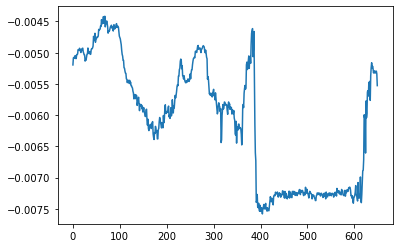

In [15]:
plt.plot(chest_vols)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

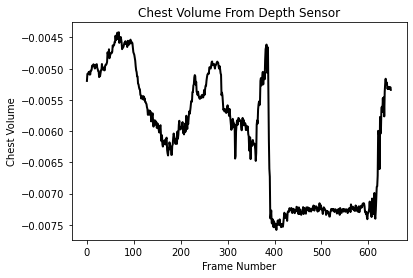

In [16]:
# First set up the figure, the axis, and the plot element we want to animate
#%matplotlib inline 

fig = plt.figure()
ax = plt.axes()

ax.set_xlabel('Frame Number')
ax.set_ylabel('Chest Volume')
ax.set_title('Chest Volume From Depth Sensor')

length = 650
#x_vals = np.linspace(0, 10, length)
x_vals = np.arange(length)
line, = ax.plot(x_vals, chest_vols, color='k', lw=2)
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)


# initialization function: plot the background of each frame
def init():
    line.set_data([], [])
    time_text.set_text('')
    return line,

# animation function.  This is called sequentially
def animate(num, x, y, line):
    print(num)
    line.set_data(x[:num], y[:num])
    return line, time_text

# call the animator. blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, fargs=[x_vals, chest_vols, line], init_func=init,
                               frames=length, interval=20, blit=True)
writer = animation.FFMpegWriter(fps=15, bitrate=1000)
anim.save("depth_sensor_chest_volume_new.mp4", writer=writer, dpi=900)
plt.show()

### Generate Images From Chest 3D Models and Volumes

skipping  0
skipping  1
skipping  2
skipping  3
skipping  4
skipping  5
skipping  6
skipping  7
skipping  8
skipping  9
skipping  10
skipping  11
skipping  12
skipping  13
skipping  14
skipping  15
skipping  16
skipping  17
skipping  18
skipping  19
skipping  20
skipping  21
skipping  22
skipping  23
skipping  24
skipping  25
skipping  26
skipping  27
skipping  28
skipping  29
skipping  30
skipping  31
skipping  32
skipping  33
skipping  34
skipping  35
skipping  36
skipping  37
skipping  38
skipping  39
skipping  40
skipping  41
skipping  42
skipping  43
skipping  44
skipping  45
skipping  46
skipping  47
skipping  48
skipping  49
skipping  50
skipping  51
skipping  52
skipping  53
skipping  54
skipping  55
skipping  56
skipping  57
skipping  58
skipping  59
skipping  60
skipping  61
skipping  62
skipping  63
skipping  64
skipping  65
skipping  66
skipping  67
skipping  68
skipping  69
skipping  70
skipping  71
skipping  72
skipping  73
skipping  74
skipping  75
skipping  76
skipping 

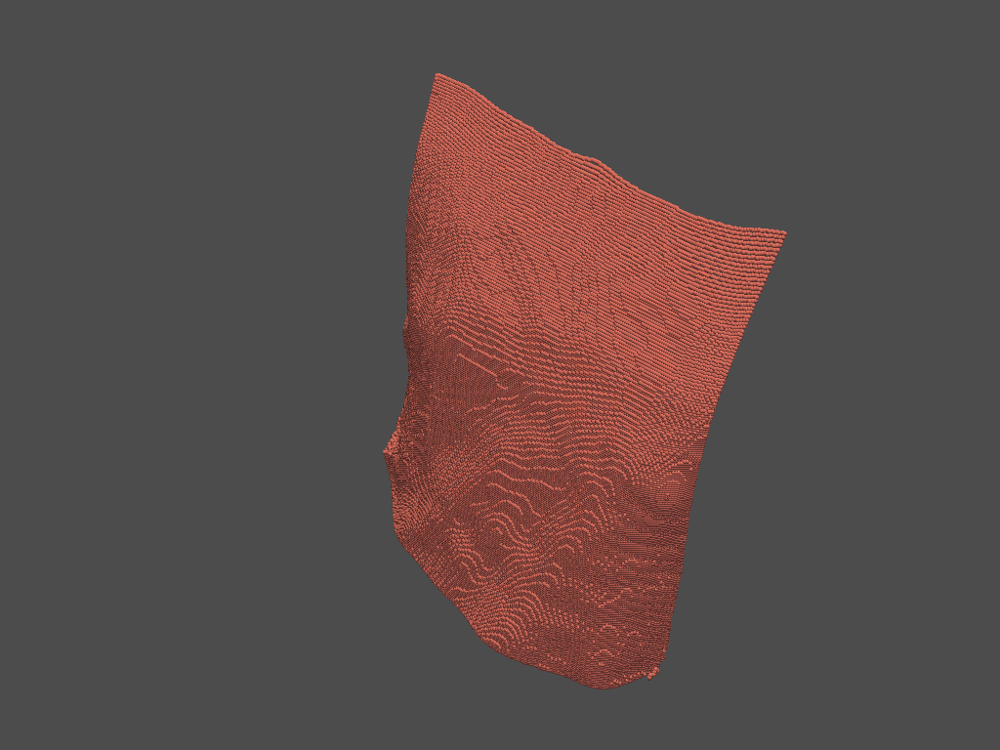

619


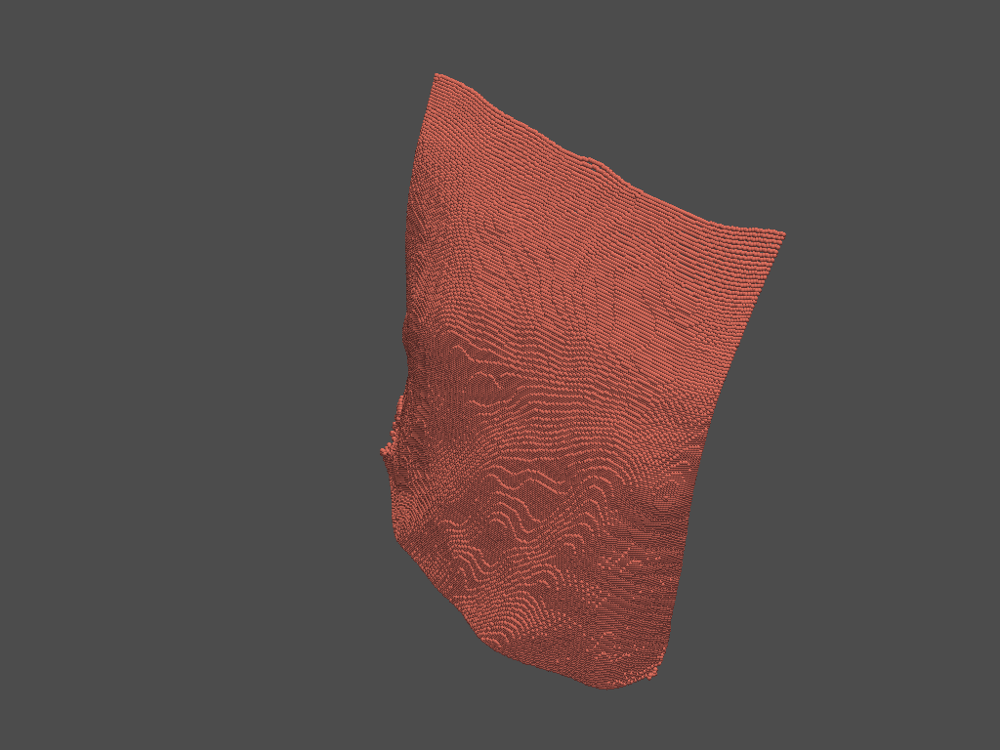

620


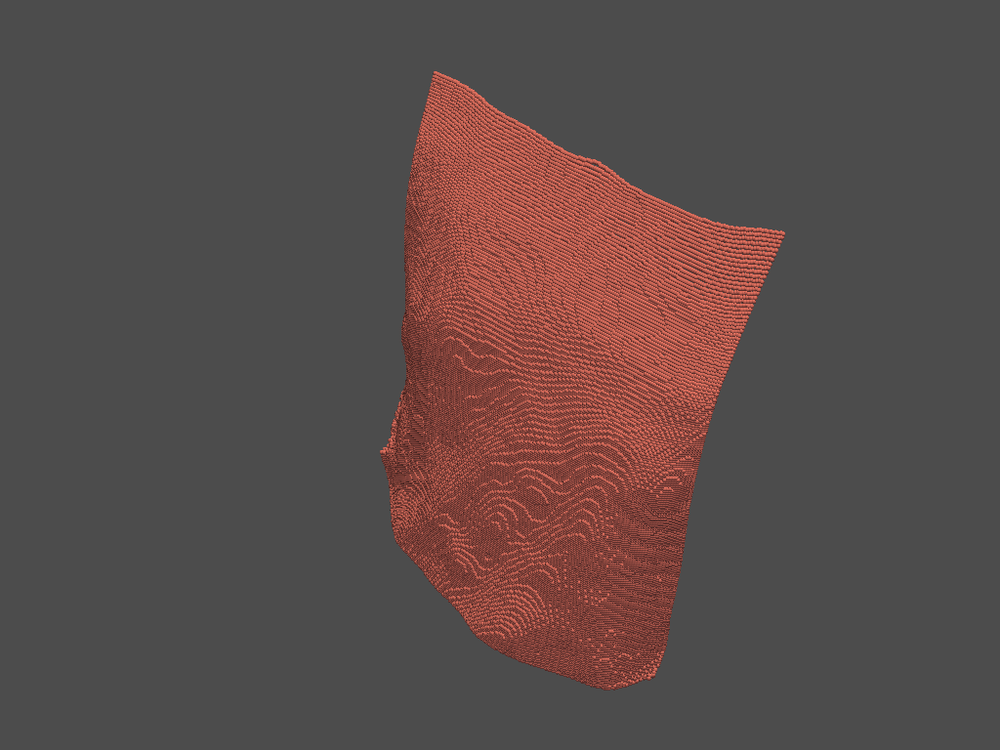

621


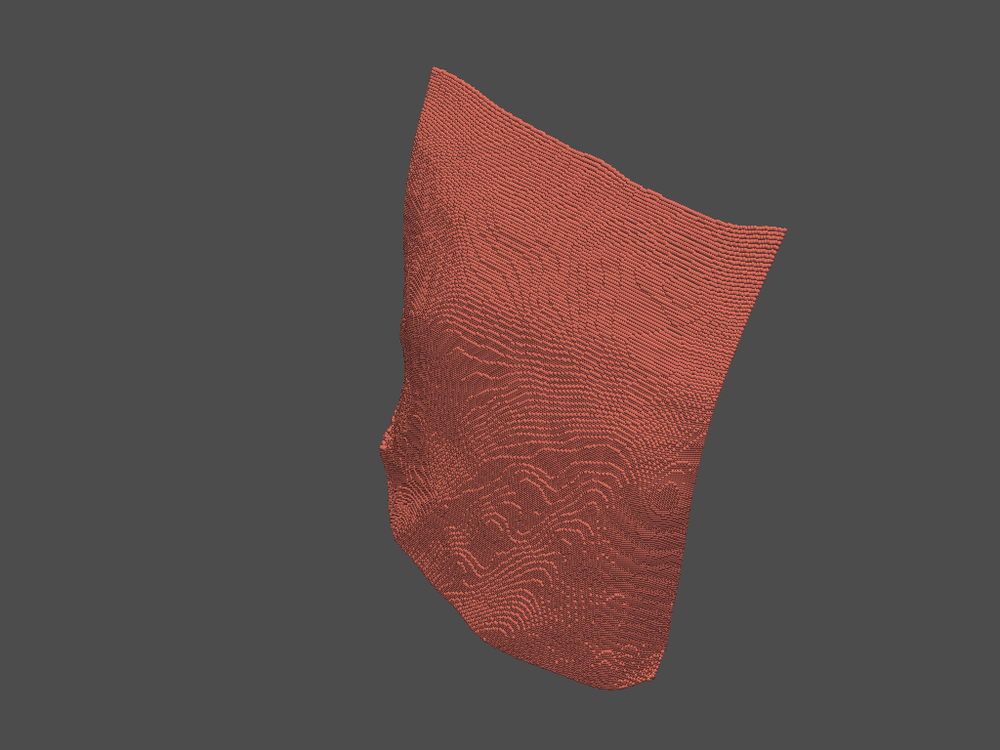

622


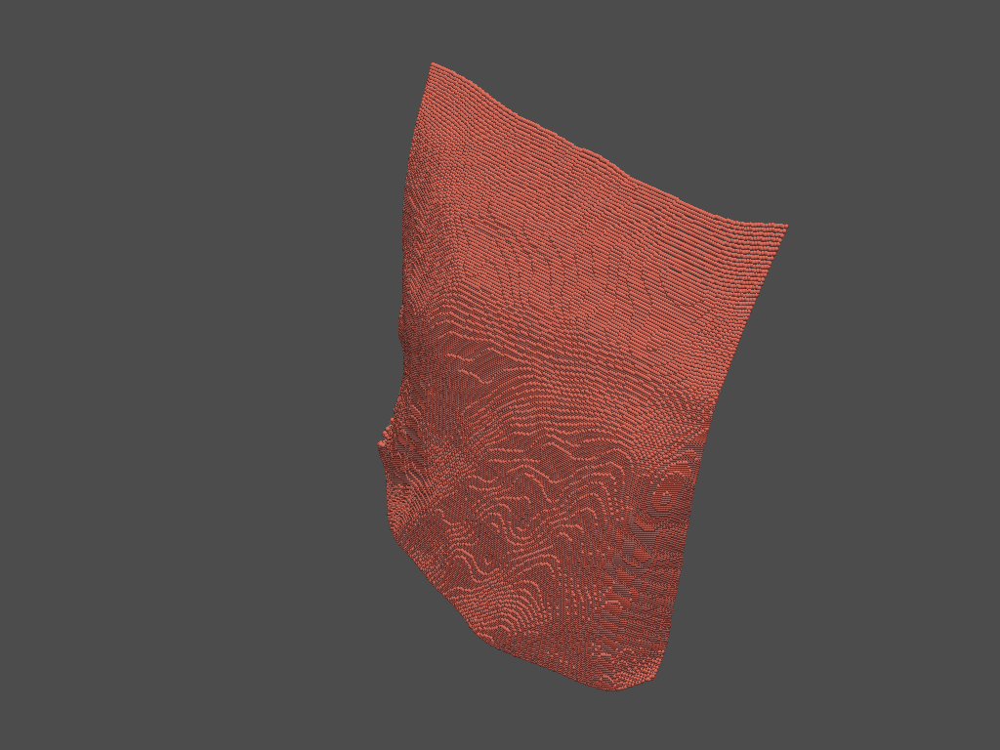

623


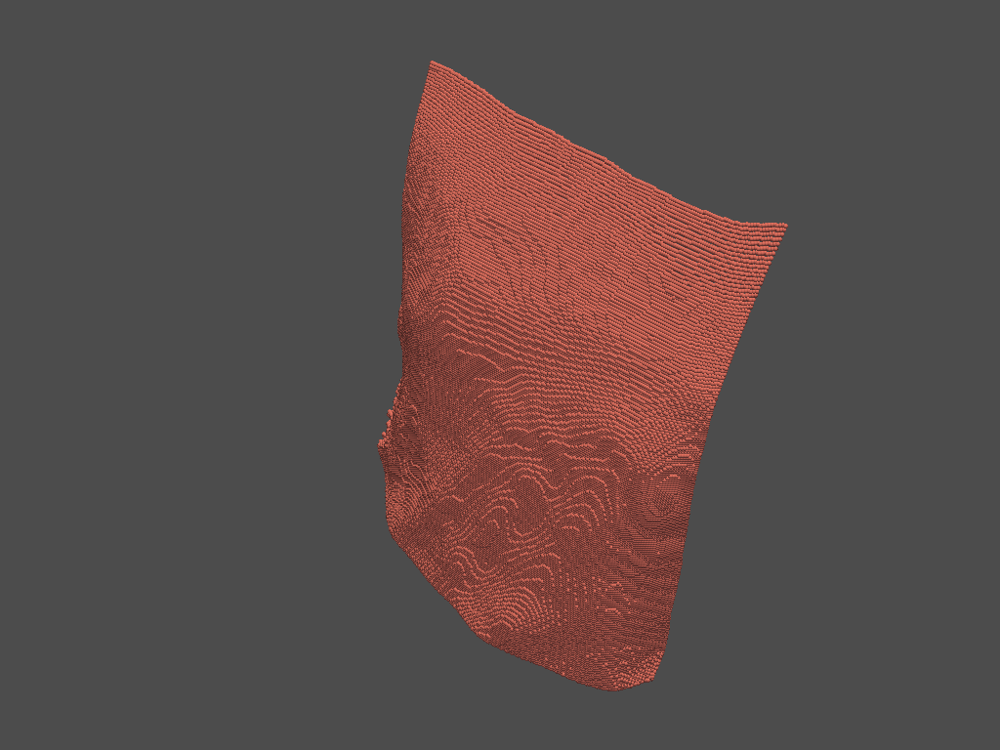

624


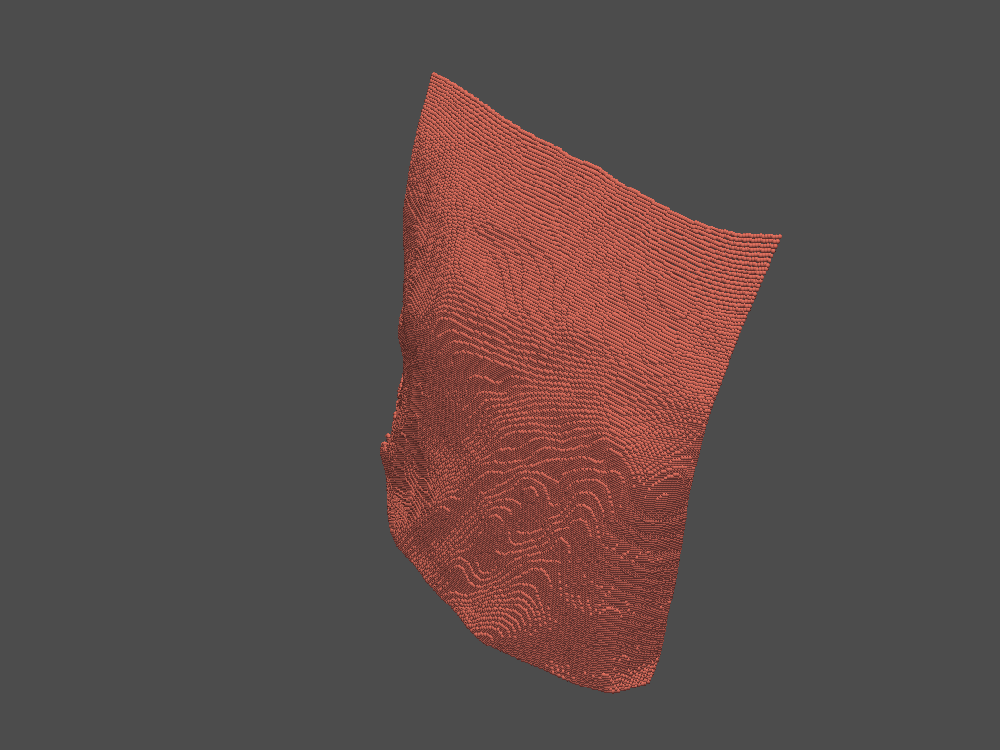

625


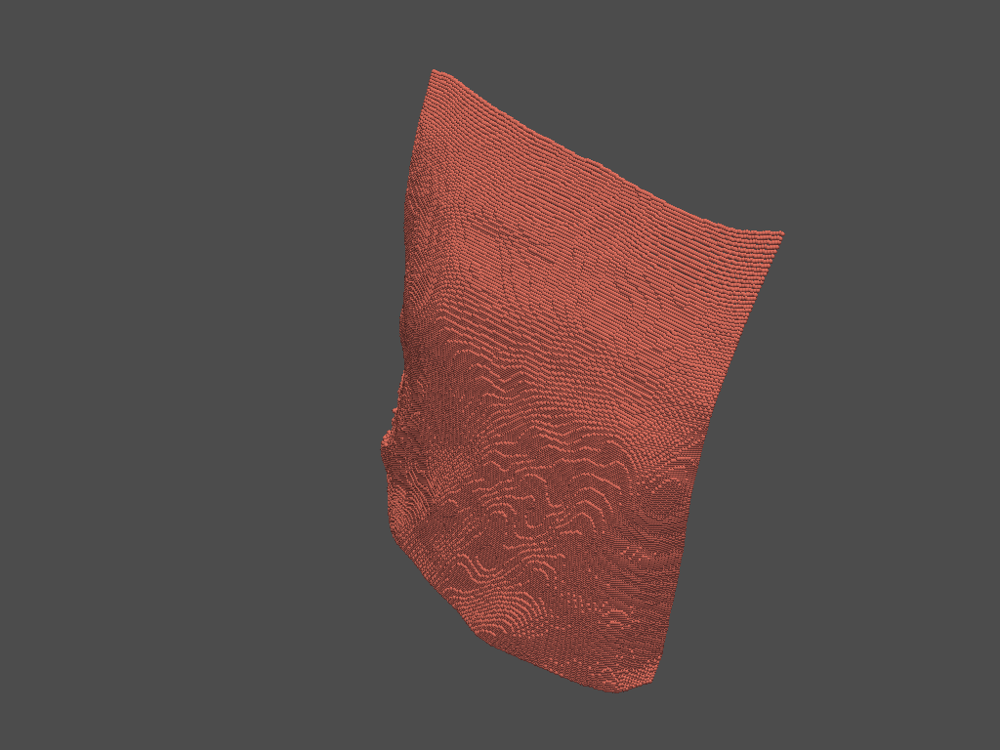

626


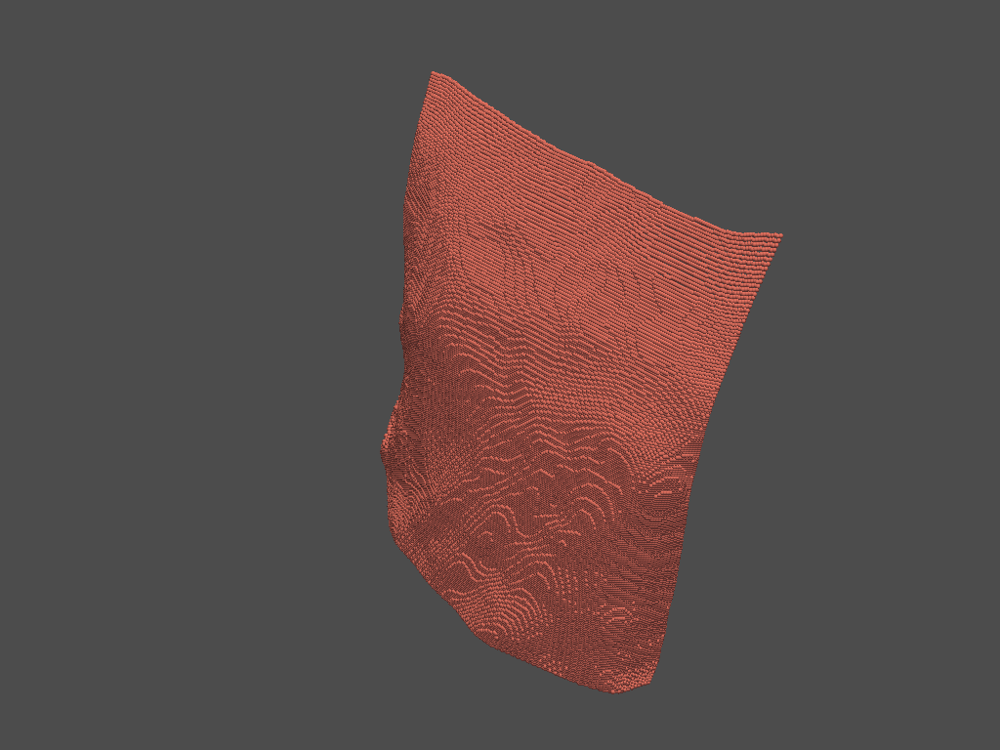

627


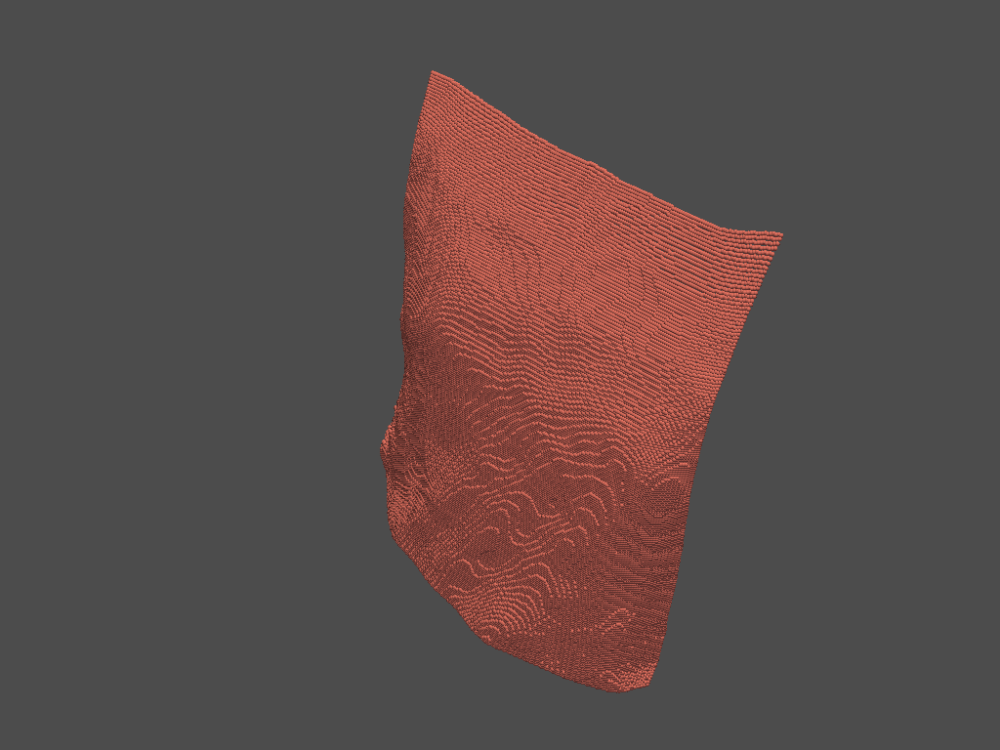

628


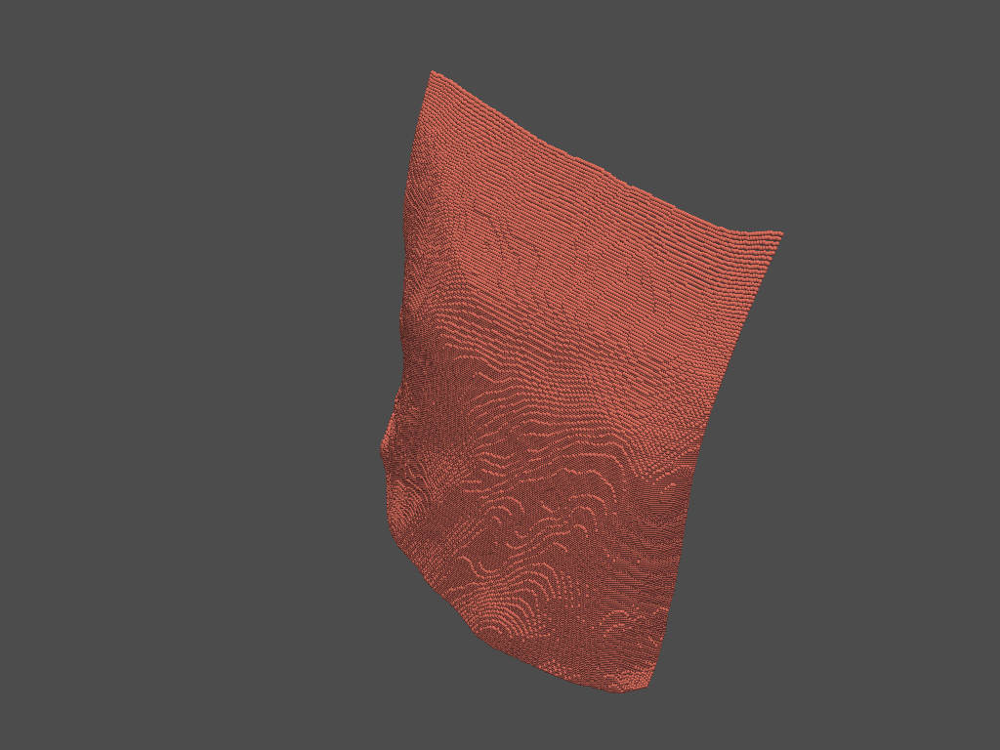

629


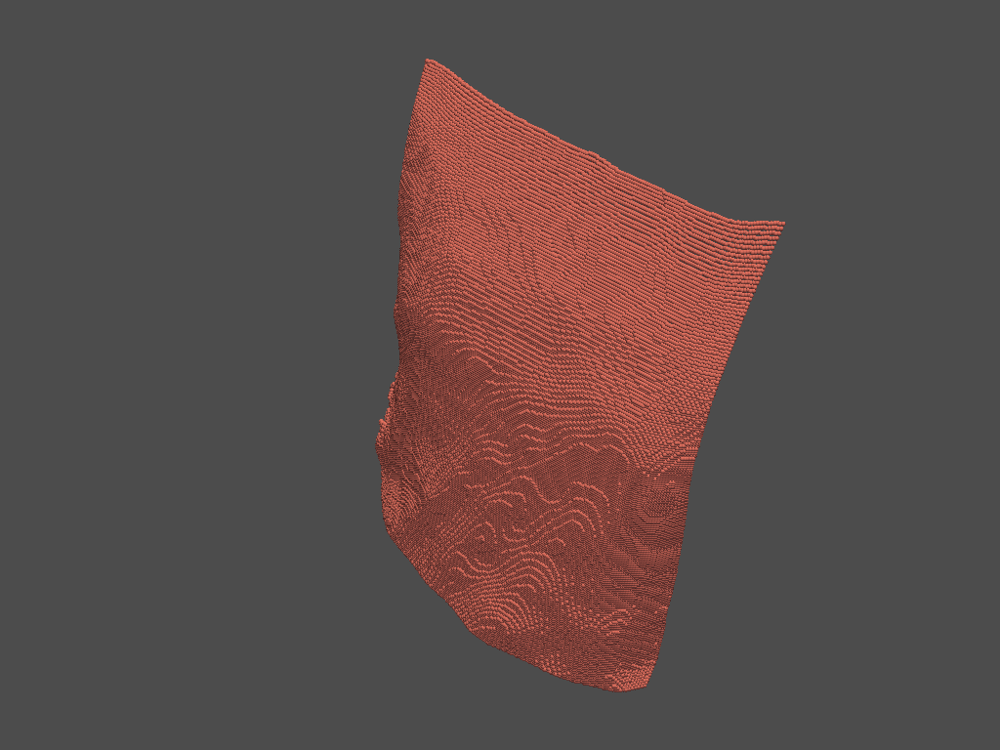

630


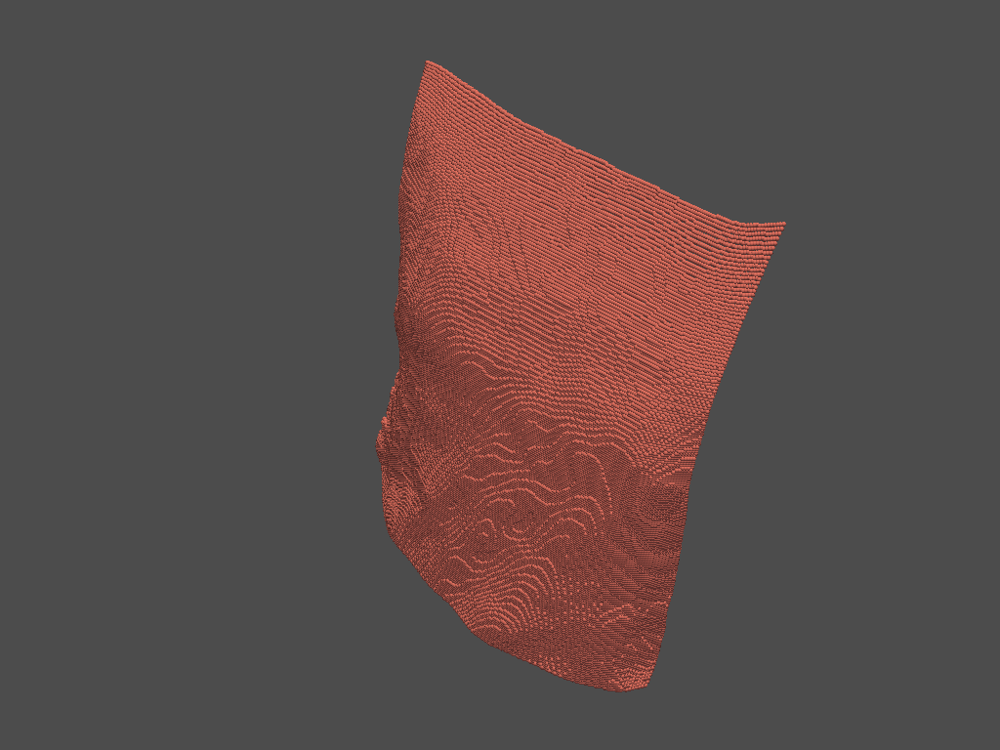

631


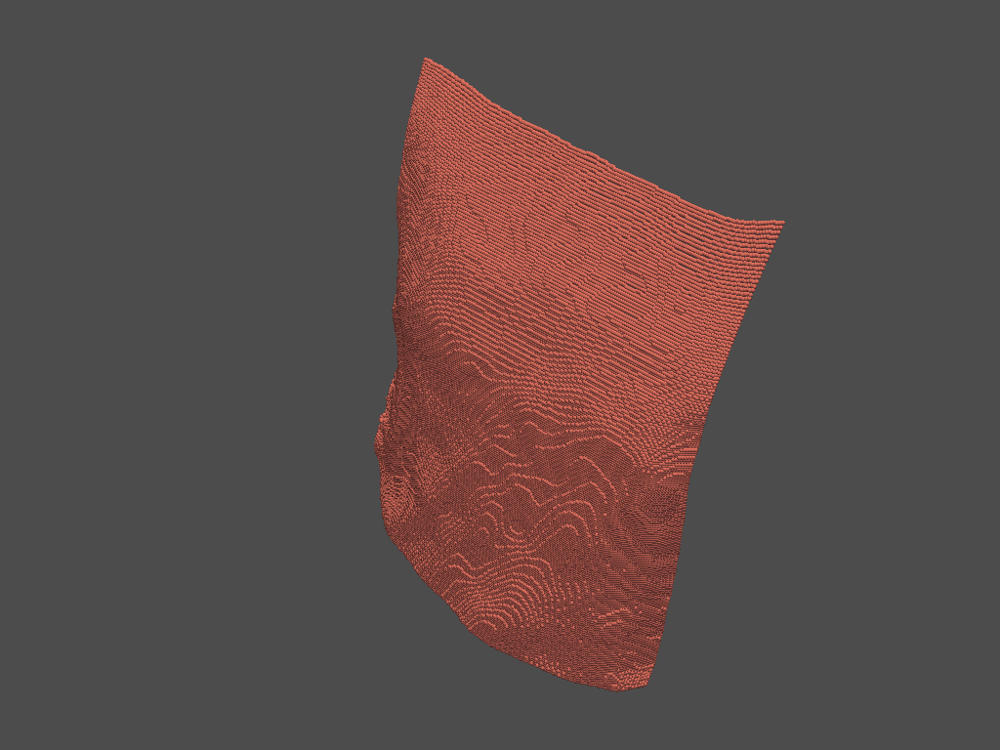

632


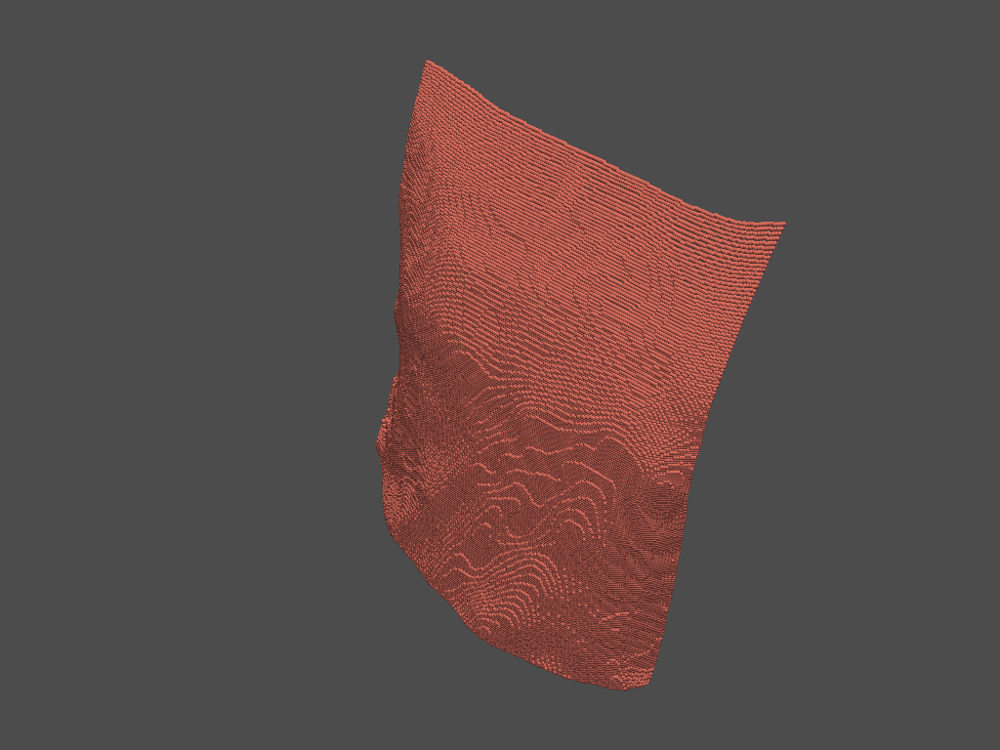

633


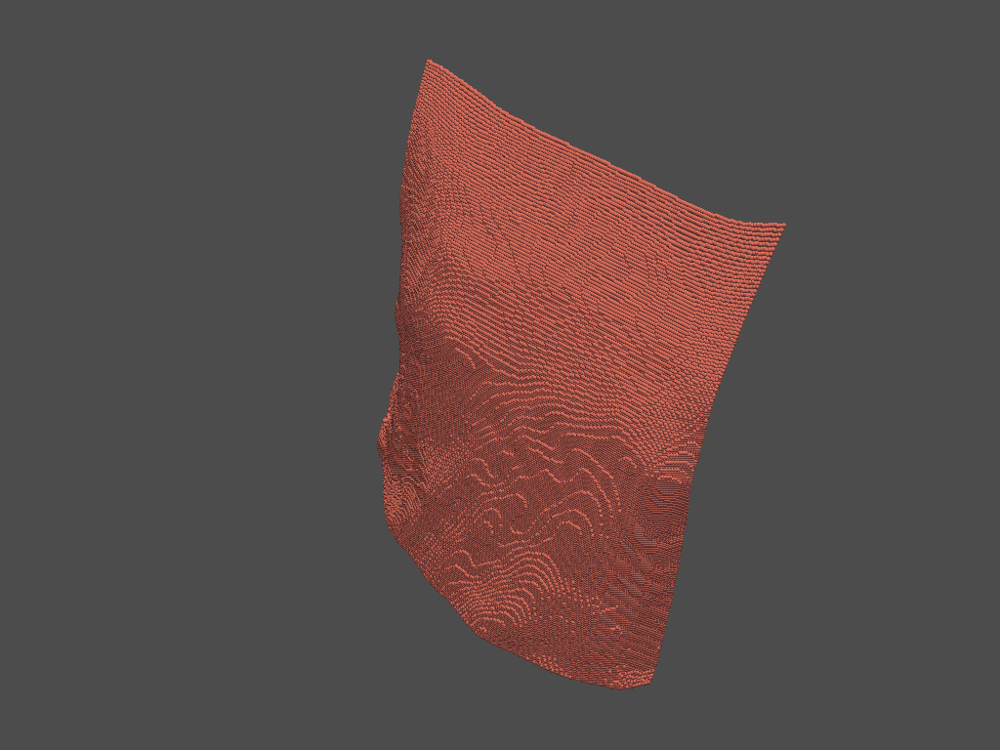

634


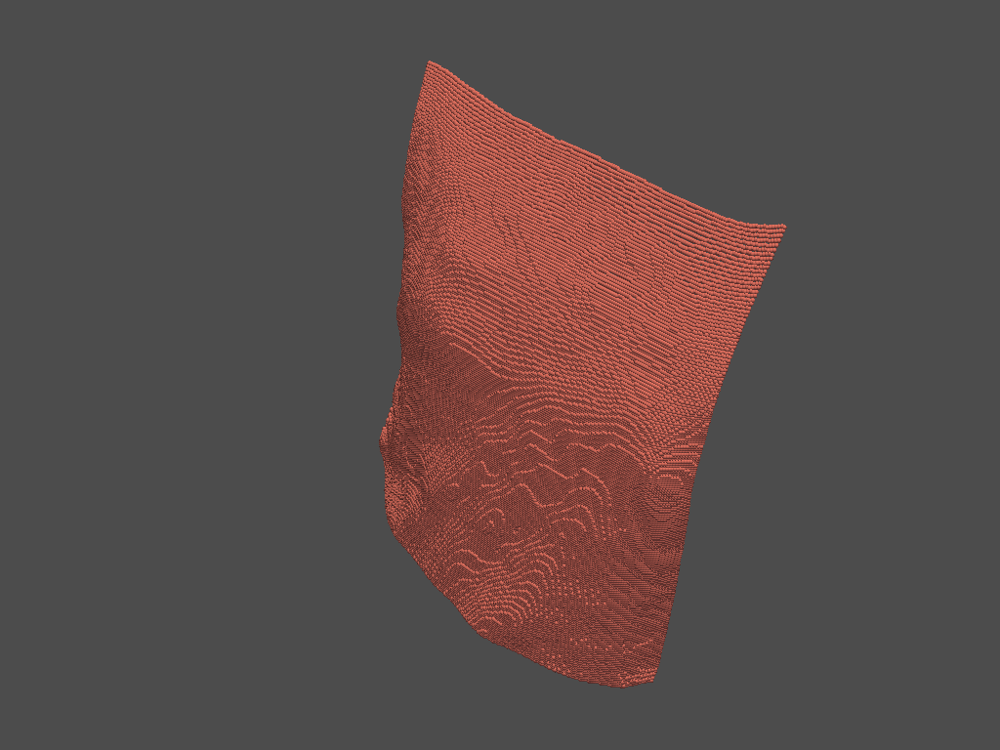

635


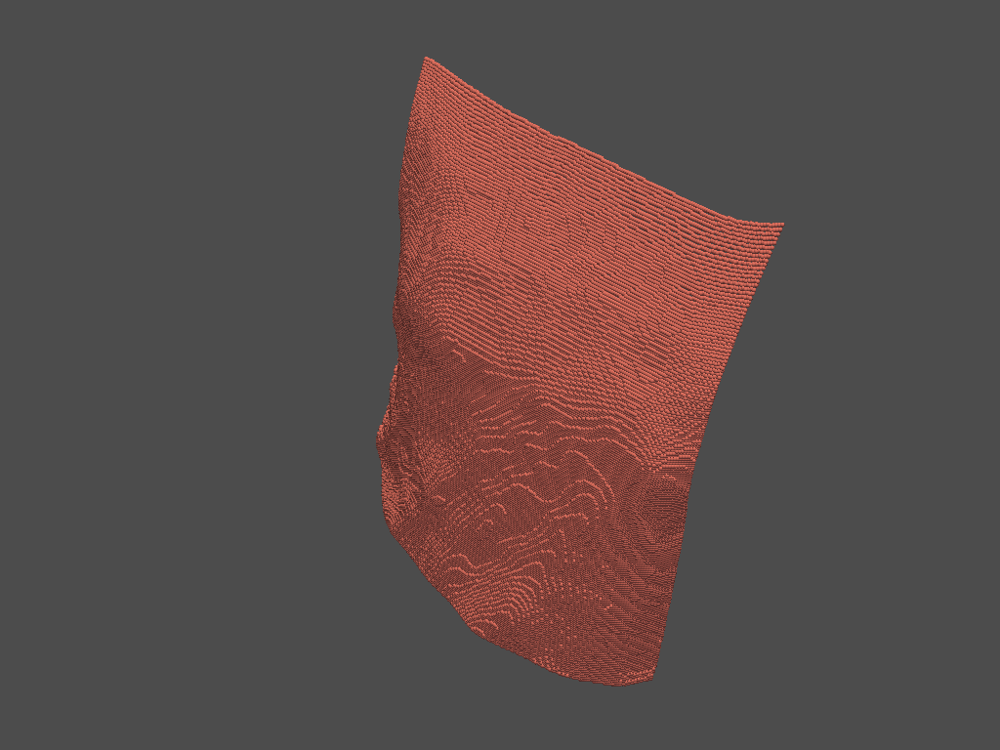

636


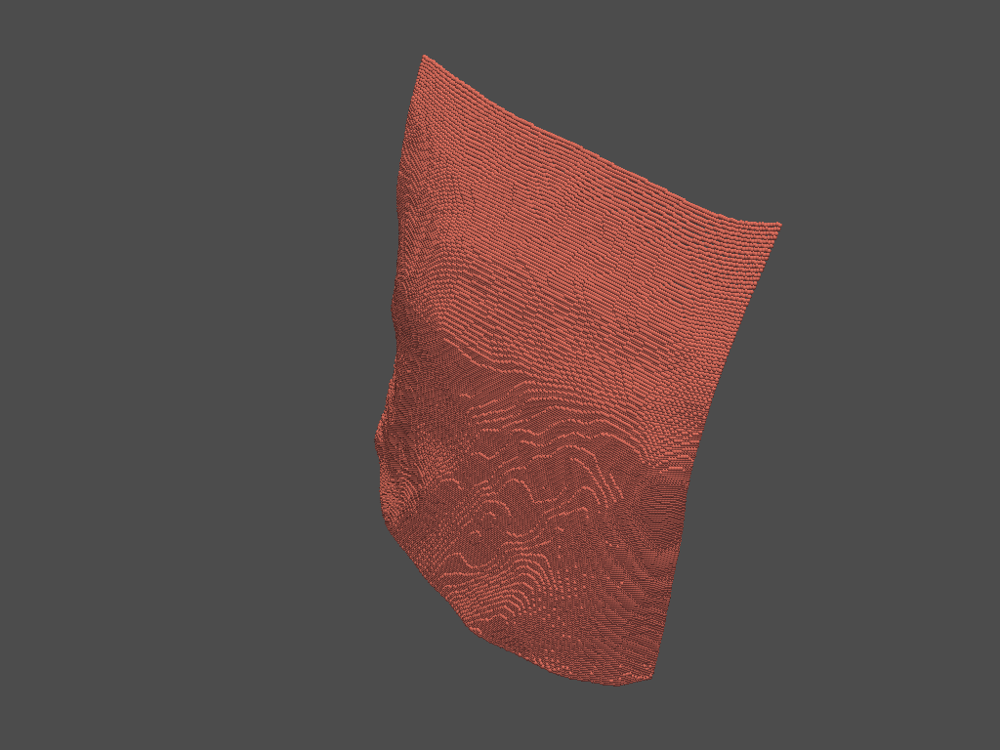

637


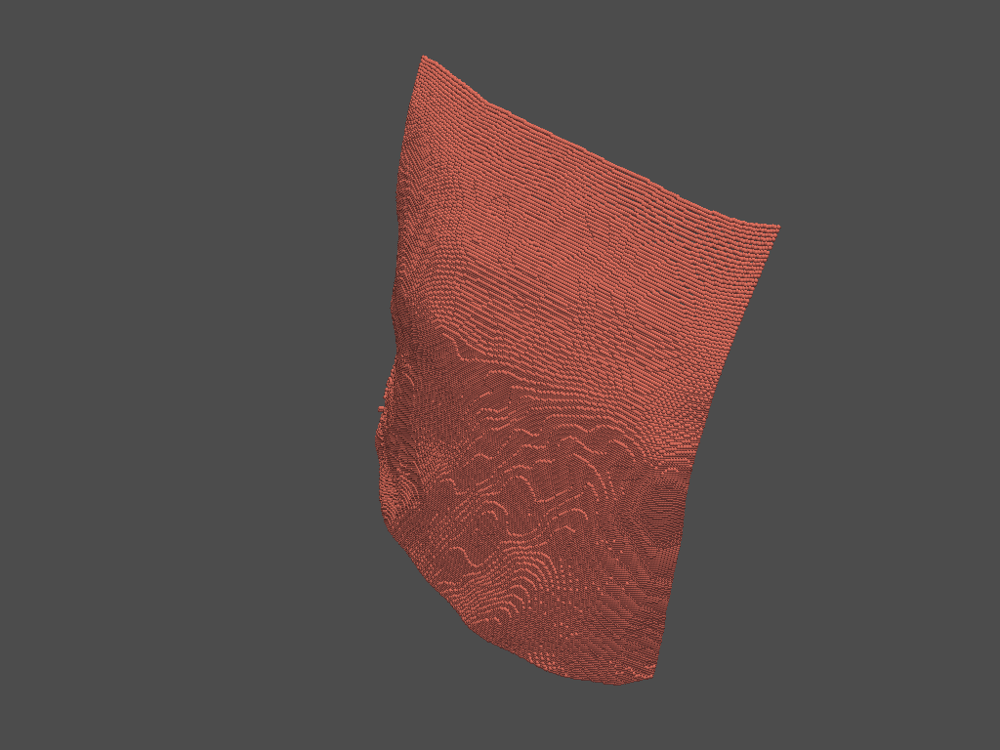

638


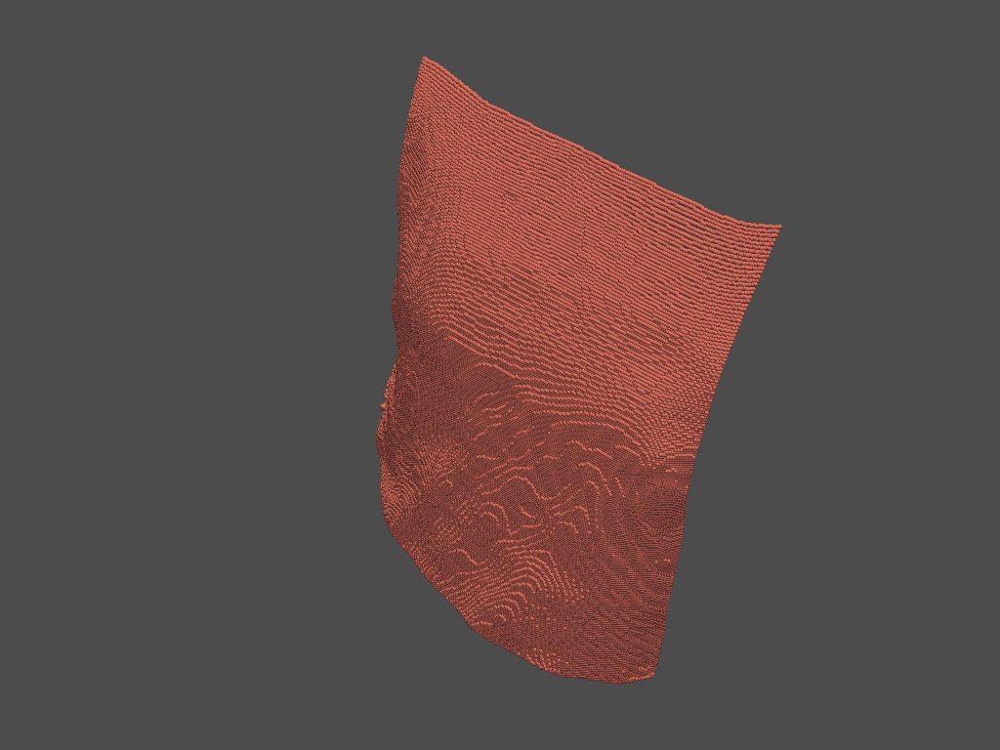

639


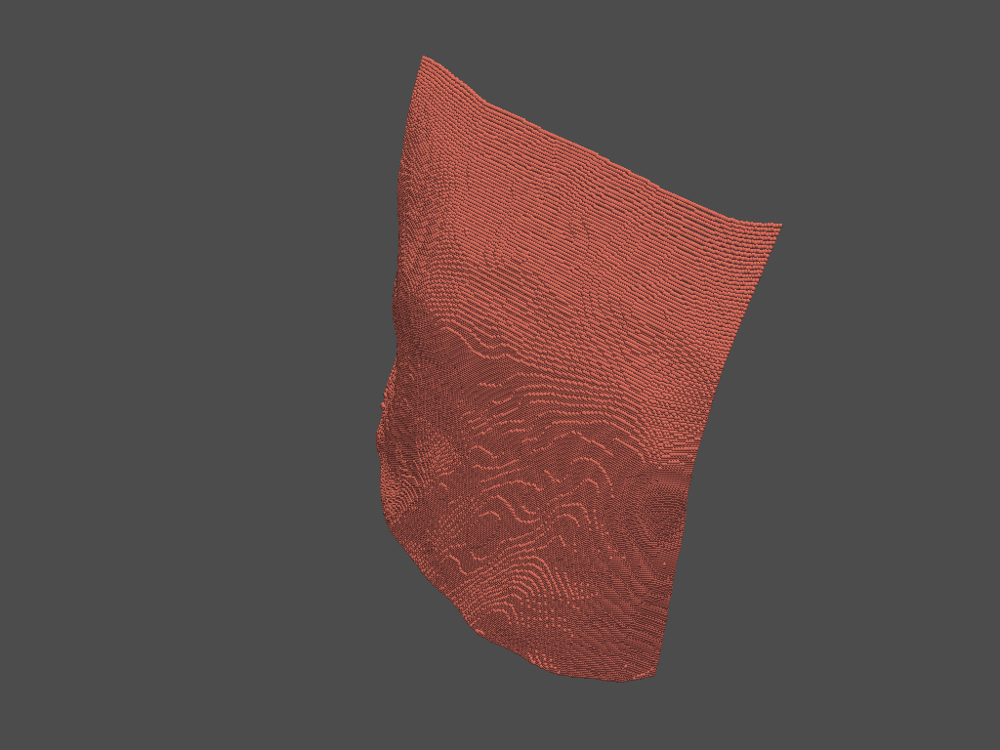

640


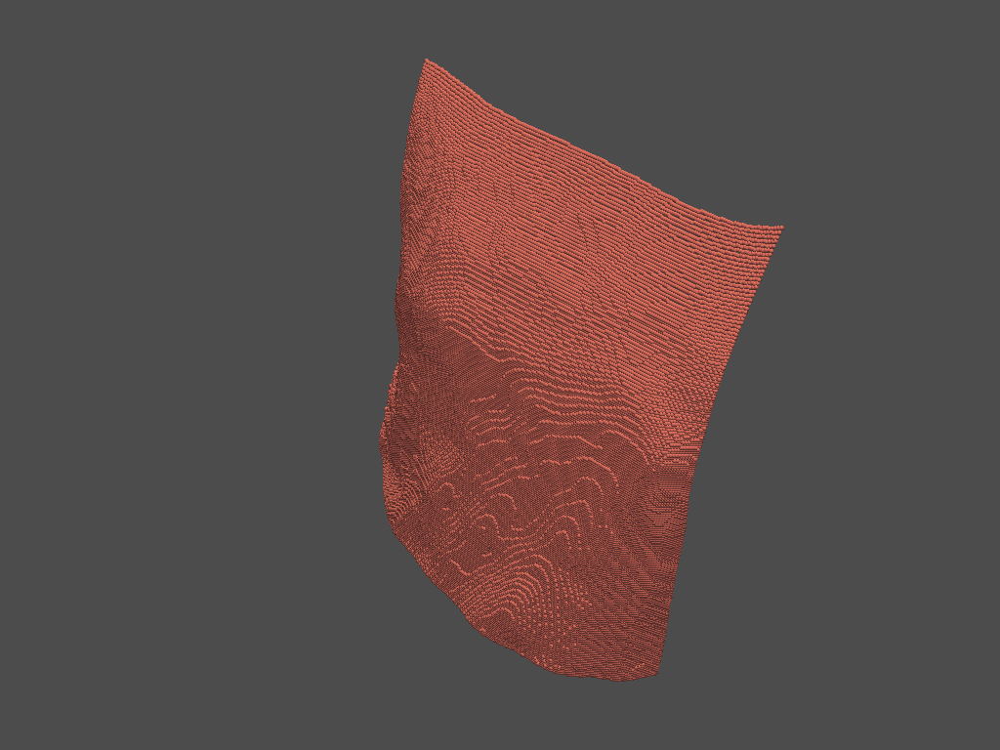

641


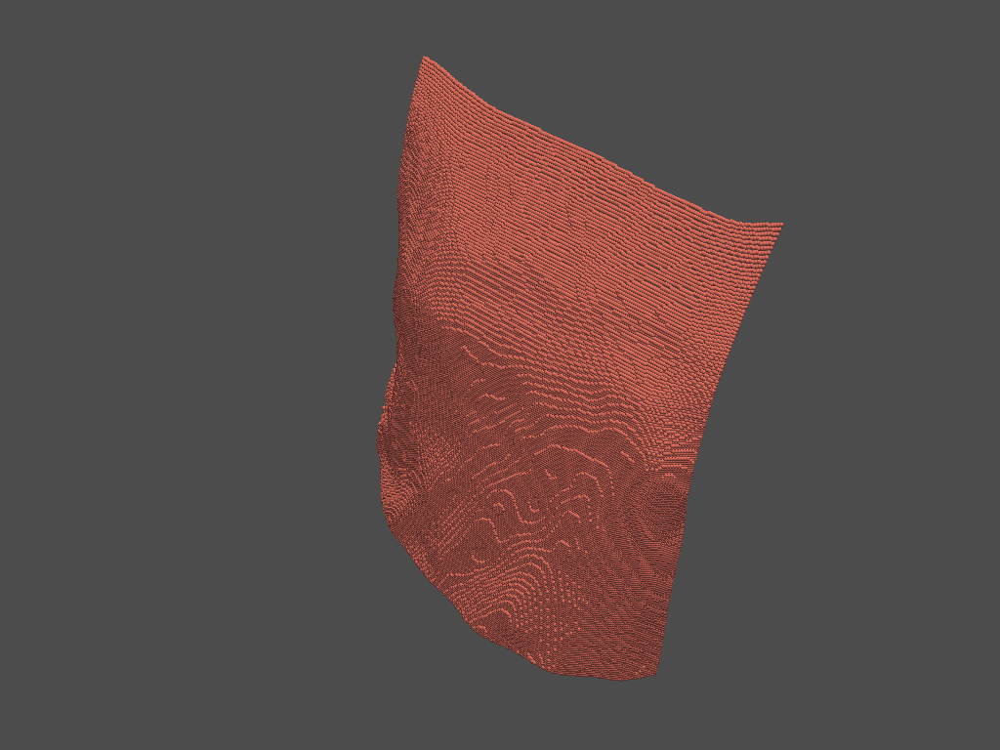

642


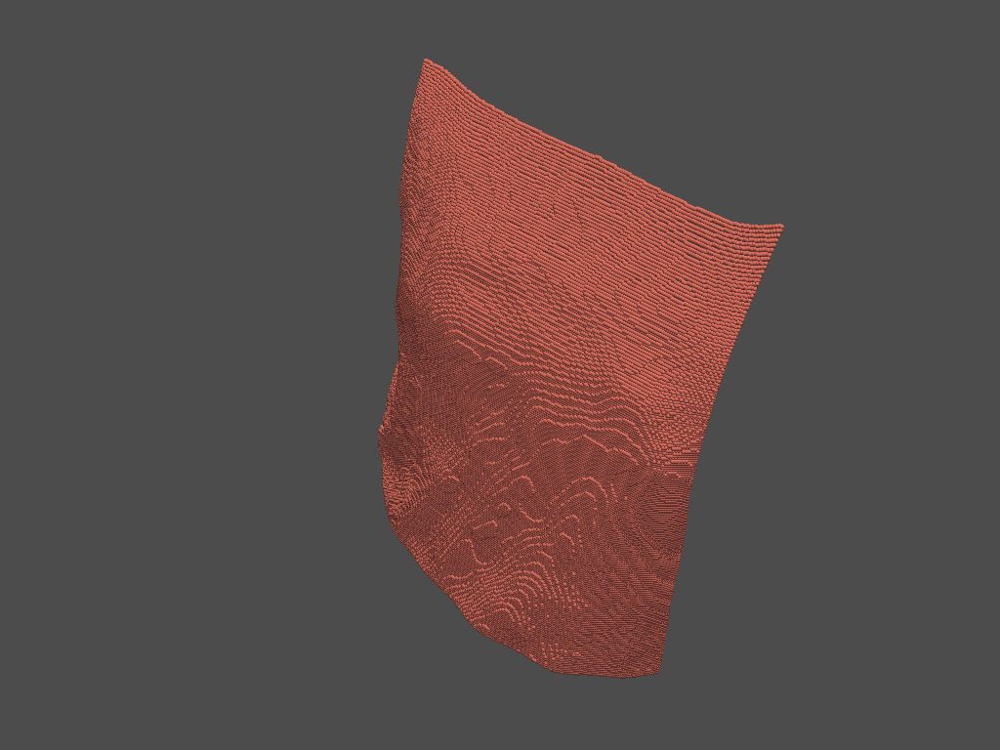

643


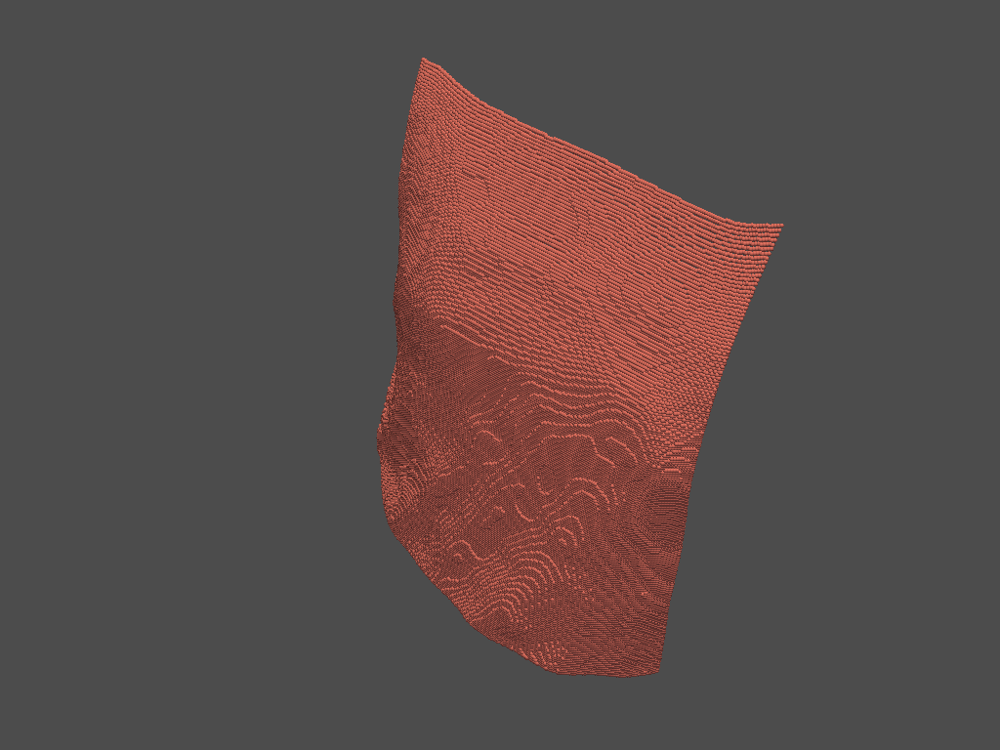

644


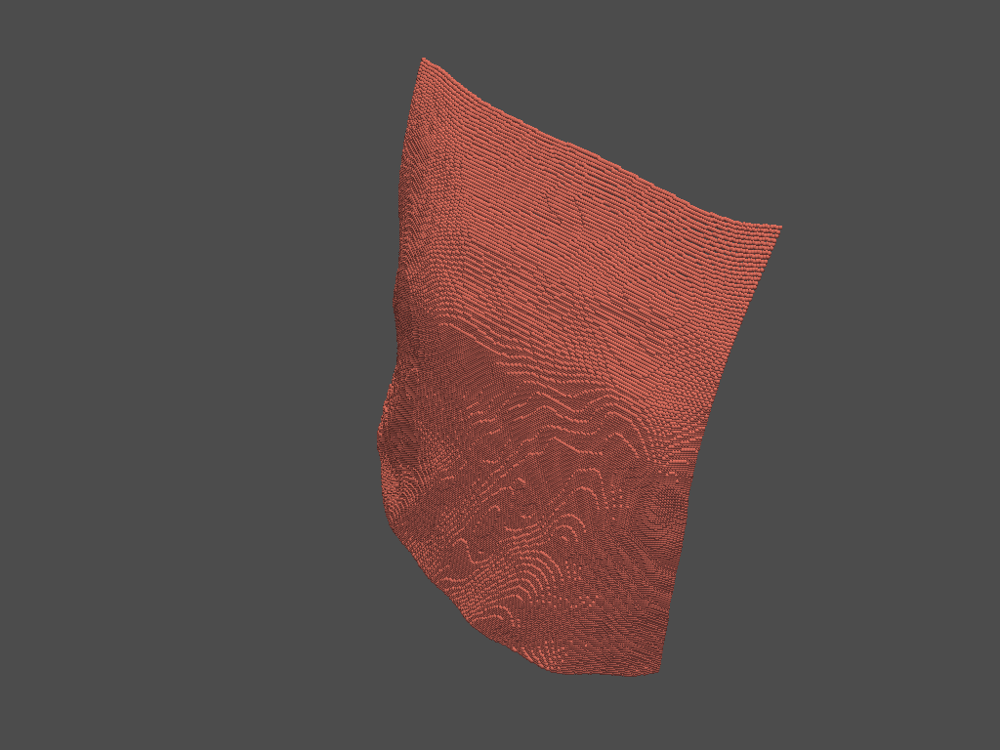

645


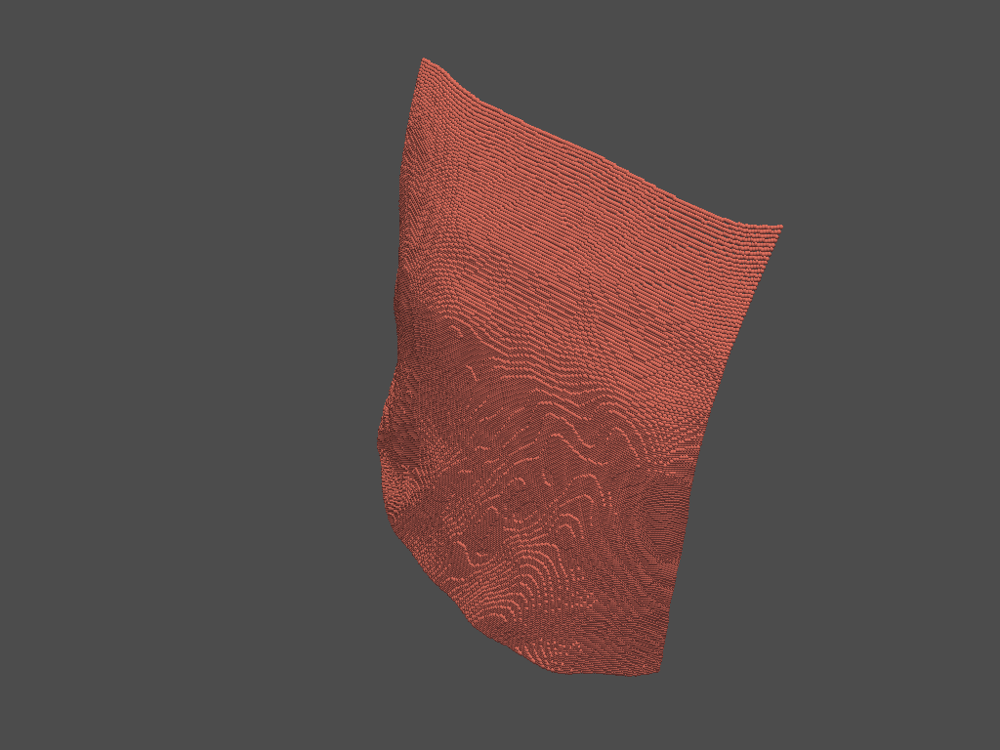

646


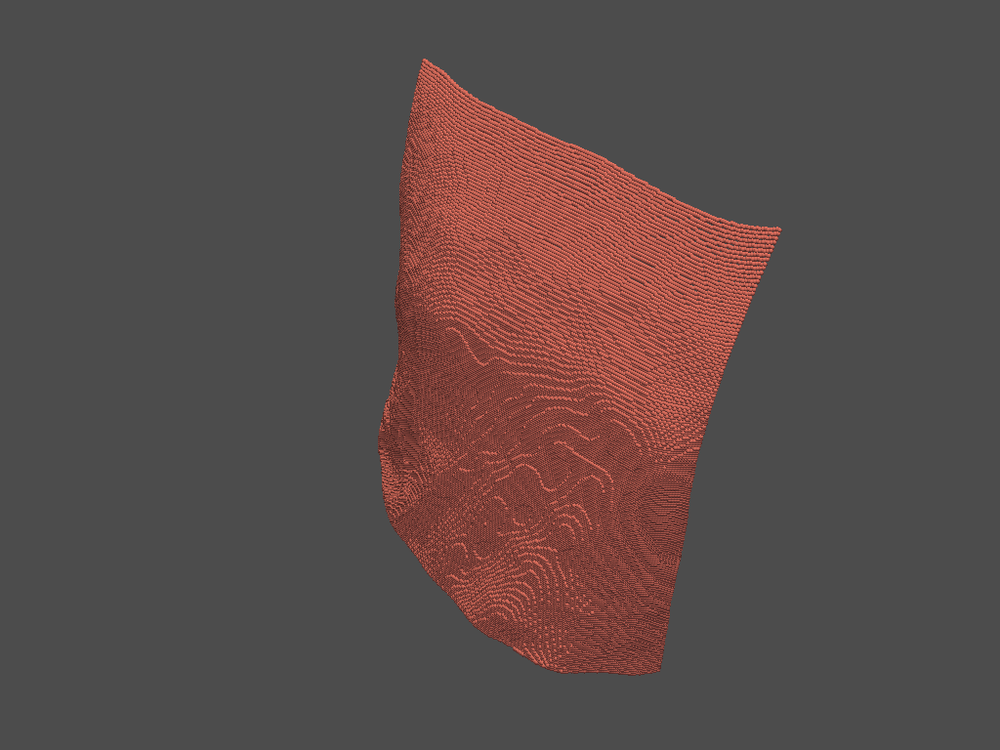

647


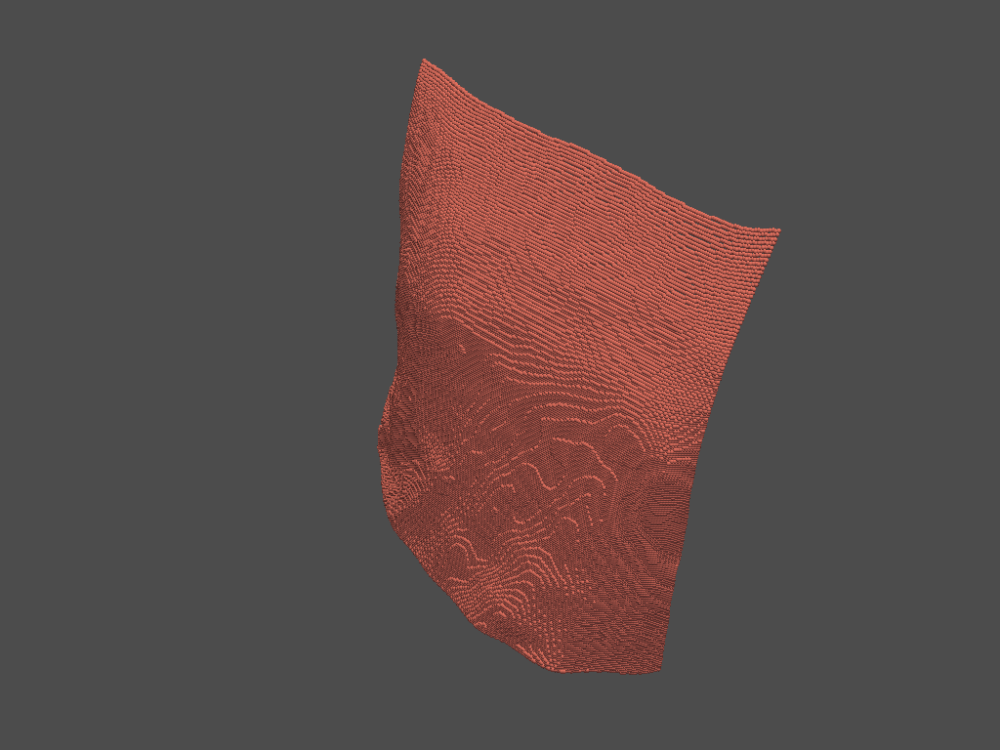

648


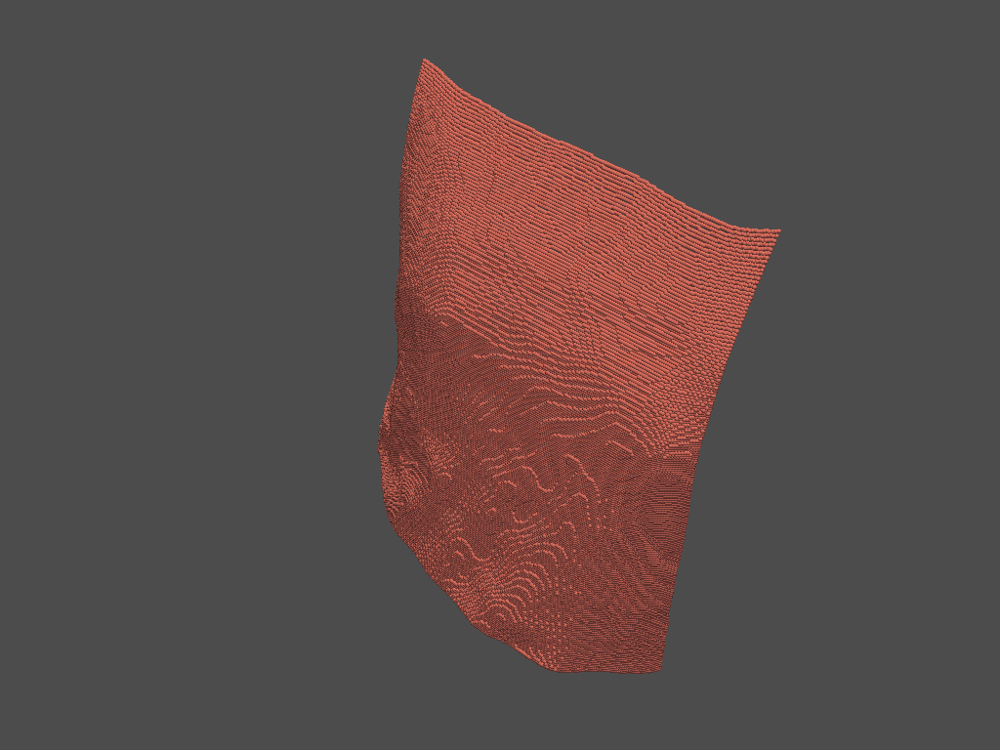

649


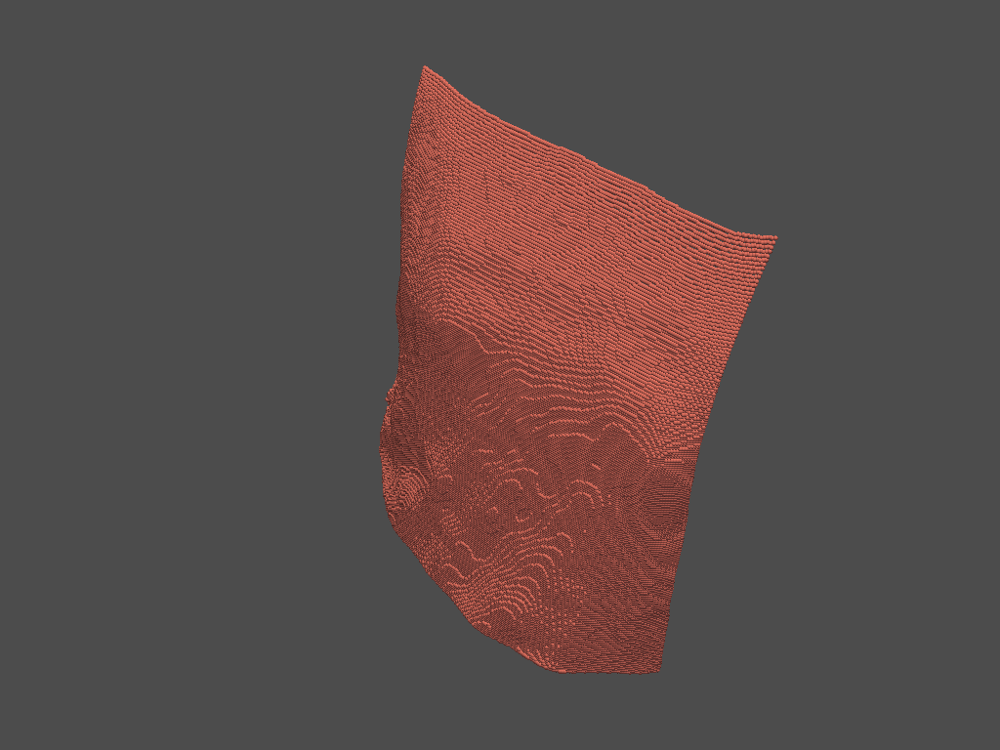

<Figure size 432x288 with 0 Axes>

In [4]:
ply_path = 'D:/realsense_data/final_run_8/ply_files'
ply_files = natsorted(os.listdir(ply_path))
chest_vols = [] 
pcd_list = [] 

plt.figure(1)
for i, file in enumerate(ply_files): 
    
    if os.path.isfile('./chest_render_movie/test_depth_' + str(i) + '.png'):
        print('skipping ', i)
        continue
        
    print(i)
    
    pcd = o3d.io.read_point_cloud(os.path.join(ply_path, file))
    pcd = cluster_chest(pcd)
    
    all_points = np.asanyarray(pcd.points)
    points_m = np.zeros_like(all_points)
    
    x, y, z = all_points[:,0].copy(), all_points[:,1].copy(), all_points[:,2].copy()
    
    theta_z = 45.6
    theta_y = -44.7
    theta_x = -45

    points_m[:,0] = x 
    points_m[:,1] = (y * np.cos(theta_x)) - (z * np.sin(theta_x))
    points_m[:,2] = (y * np.sin(theta_x)) + (z * np.cos(theta_x))

    x, y, z = points_m[:,0].copy(), points_m[:,1].copy(), points_m[:,2].copy()

    points_m[:,0] = (x * np.cos(theta_z)) - (y * np.sin(theta_z))
    points_m[:,1] = (x * np.sin(theta_z)) + (y * np.cos(theta_z))
    points_m[:,2] = z

    x, y, z = points_m[:,0].copy(), points_m[:,1].copy(), points_m[:,2].copy()

    points_m[:,0] = (x * np.cos(theta_y)) + (z * np.sin(theta_y))
    points_m[:,1] = y
    points_m[:,2] =  (z * np.cos(theta_y)) - (x * np.sin(theta_y))

    cloud = pv.PolyData(points_m)
    cloud.compute_normals(inplace=True)
    
#     blue = np.array([12/256, 238/256, 246/256, 1])
#     black = np.array([11/256, 11/256, 11/256, 1])
#     grey = np.array([189/256, 189/256, 189/256, 1])
#     yellow = np.array([255/256, 247/256, 0/256, 1])
#     red = np.array([1, 0, 0, 1])

#     mapping = np.linspace(cloud.verts.min(), cloud.verts.max(), 256)
#     newcolors = np.empty((256, 4))
#     newcolors[mapping >= 80] = red
#     newcolors[mapping < 80] = grey
#     newcolors[mapping < 55] = yellow
#     newcolors[mapping < 30] = blue
#     newcolors[mapping < 1] = black
    
#     my_colormap = ListedColormap(newcolors)
    
    cloud.plot(render_points_as_spheres=True, color='salmon', screenshot='./chest_render_movie/test_depth_' + str(i) + '.png')

### Use Images to Generate Video

In [10]:
volume_vals = np.load('D:/realsense_data/final_run_8/chest_vols_run_8.npy')
volume_vals = -volume_vals

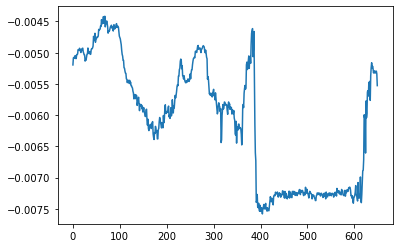

In [11]:
plt.plot(volume_vals)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

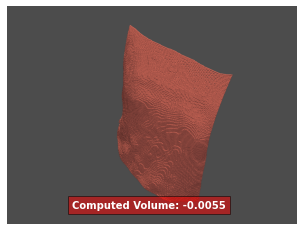

In [13]:
img_dir = './chest_render_movie/'
img_files = natsorted(os.listdir(img_dir))
imgs = np.array([io.imread(os.path.join(img_dir, x)) for x in img_files if x.endswith('.png')])
#volume_vals = np.load('./volumes/chest_vol_4.npy')

frames = [] # for storing the generated images
fig = plt.figure()
ax = fig.add_subplot(111)
ax.axis('off')
for i in np.arange(650):
    print(i)
    img = ax.imshow(imgs[i], animated=True)
    t = ax.text(500, 700, 'Computed Volume: ' + "{:.4f}".format(volume_vals[i]), fontweight='bold', color='white', bbox=dict(facecolor='red', alpha=0.5), horizontalalignment='center', verticalalignment='center')
    frames.append([img, t])

ani = animation.ArtistAnimation(fig, frames, interval=1000, blit=True)

writer = animation.FFMpegWriter(fps=15, bitrate=1000)
ani.save('chest_rendering_with_volume_new.mp4', writer=writer, dpi=900)

print('Done ')

### Visualize Mesh and Point Clouds

In [ ]:
# visualize using o3d
o3d.visualization.draw_geometries([mesh_list[0][0]])

In [ ]:
# visualize point cloud and minimum convex hull
pcl = mesh.sample_points_poisson_disk(number_of_points=2000)
hull, _ = pcl.compute_convex_hull()
hull_ls = o3d.geometry.LineSet.create_from_triangle_mesh(hull)
hull_ls.paint_uniform_color((1, 0, 0))
o3d.visualization.draw_geometries([mesh_list[0][0], hull_ls])

In [ ]:
# visualize using trimesh
tri_mesh.show()